#### PASO 1: CONFIGURACIÓN DEL ENTORNO E IMPORTACIÓN DE LIBRERÍAS

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import warnings
warnings.filterwarnings('ignore')


# Cargar los datos
file_path = '../cleaned_main_financial_metrics.csv'
df = pd.read_csv(file_path)
print(df.shape)
# df=df[df['numberOfAnalystOpinions']>4].copy()
df=df[df['enterpriseValue']>0].copy()
print(df.shape)


# --- Configuración de Visualización ---
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
pd.set_option('display.float_format', lambda x: f'{x:.3f}' if abs(x) > 0.01 else f'{x:.3e}')
pd.set_option('display.width', 1000)
sns.set_style('whitegrid')
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.autolayout'] = True # Ajuste automático de layout

# --- Directorio de Salida para Gráficos ---
# output_dir = "EDA_Graficos"
# if not os.path.exists(output_dir):
#     os.makedirs(output_dir)
# print(f"Los gráficos se guardarán en: '{output_dir}/'")

display(df.head())


(1502, 56)
(1498, 56)


,recommendationClass,recommendationKey,recommendationMean,numberOfAnalystOpinions,shortName,symbol,Ticker,sector,state,fullExchangeName,In_SP500,In_NASDAQ,currentPrice,allTimeHigh,allTimeLow,beta,averageVolume,marketCap,enterpriseValue,priceToBook,enterpriseToRevenue,profitMargins,grossMargins,ebitdaMargins,operatingMargins,returnOnAssets,returnOnEquity,totalRevenue,revenuePerShare,grossProfits,ebitda,netIncomeToCommon,trailingEps,totalCash,totalCashPerShare,totalDebt,quickRatio,currentRatio,bookValue,operatingCashflow,freeCashflow,trailingAnnualDividendYield,payoutRatio,sharesOutstanding,floatShares,sharesShort,sharesPercentSharesOut,shortRatio,shortPercentOfFloat,heldPercentInsiders,heldPercentInstitutions,fullTimeEmployees,is_Insolvent,_debtToEquity,has_benefits,_PER
0,0,Strong Buy,1.320,22.000,S&P Global Inc.,SPGI,SPGI,Financial Services,NY,NYSE,True,False,473.190,579.050,0.336,1.189,1409834.000,144464904192.000,159203901440.000,4.327,10.830,0.273,0.696,0.494,0.427,0.063,0.113,14700000256.000,47.689,10225000448.000,7260000256.000,4011000064.000,13.010,1847000064.000,6.050,12014999552.000,0.807,0.982,109.368,5583000064.000,4932874752.000,7.923e-03,0.287,305300000.000,304622234.000,3085150.000,0.010,1.980,0.010,2.530e-03,0.905,42350.000,0,109858455.417,0,36.371
1,2,Hold,2.250,17.000,General Dynamics Corporation,GD,GD,Industrials,VA,NYSE,True,False,331.150,347.370,0.338,0.484,1044250.000,89077145600.000,98039226368.000,3.772,1.950,0.081,0.154,0.121,0.102,0.058,0.179,50273001472.000,185.340,7743000064.000,6072999936.000,4086000128.000,14.900,1523000064.000,5.670,10618999808.000,0.737,1.364,87.792,5016999936.000,3491124992.000,0.018,0.392,268993342.000,251745725.000,2689182.000,1.000e-02,2.390,0.011,5.080e-03,0.867,117000.000,0,120956349.189,0,22.225
2,1,Buy,1.455,11.000,"Life Time Group Holdings, Inc.",LTH,LTH,Consumer Cyclical,MN,NYSE,False,False,25.700,34.990,8.750,1.702,2283057.000,5653899776.000,9564423168.000,1.970,3.387,0.080,0.472,0.251,0.159,0.036,0.087,2824026880.000,13.425,1334104064.000,707478016.000,226762000.000,1.020,180280000.000,0.819,4090802944.000,0.411,0.647,13.048,693841024.000,36997000.000,0.000e+00,0.000e+00,219996102.000,161164744.000,7582910.000,0.035,3.660,0.057,0.126,0.804,49000.000,0,313519538.933,0,25.196
3,2,Hold,2.000,30.000,Veeva Systems Inc.,VEEV,VEEV,Healthcare,CA,NYSE,False,False,283.730,343.960,17.110,0.982,1325242.000,46505623552.000,40187355136.000,7.004,13.539,0.273,0.756,0.293,0.287,0.072,0.137,2968217088.000,18.248,2243760128.000,869854976.000,809932032.000,4.850,6403713024.000,39.069,85448000.000,5.479,5.573,40.509,1349251968.000,1096729856.000,0.000e+00,0.000e+00,163908013.000,150420023.000,5329311.000,0.033,4.060,0.035,0.085,0.886,7291.000,0,2109358.414,0,58.501
4,4,Strong Sell,2.971,27.000,lululemon athletica inc.,LULU,LULU,Consumer Cyclical,BC,NasdaqGS,True,True,167.410,516.390,2.165,1.072,4981781.000,19853010944.000,20459077632.000,4.539,1.876,0.164,0.591,0.273,0.207,0.219,0.424,10904036352.000,90.031,6443886080.000,2976704000.000,1785750016.000,14.650,1155794048.000,9.747,1762717952.000,0.832,2.266,36.885,1911771008.000,1018826496.000,0.000e+00,0.000e+00,113468082.000,109026169.000,8600626.000,0.072,1.070,0.099,0.046,0.888,39000.000,0,47789560.851,0,11.427


#### PASO 2: CARGA DE DATOS Y SELECCIÓN DE VARIABLES


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1498 entries, 0 to 1501
Data columns (total 56 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   recommendationClass          1498 non-null   int64  
 1   recommendationKey            1498 non-null   object 
 2   recommendationMean           1498 non-null   float64
 3   numberOfAnalystOpinions      1498 non-null   float64
 4   shortName                    1498 non-null   object 
 5   symbol                       1498 non-null   object 
 6   Ticker                       1498 non-null   object 
 7   sector                       1498 non-null   object 
 8   state                        1498 non-null   object 
 9   fullExchangeName             1498 non-null   object 
 10  In_SP500                     1498 non-null   bool   
 11  In_NASDAQ                    1498 non-null   bool   
 12  currentPrice                 1498 non-null   float64
 13  allTimeHigh            

In [4]:
# 1. Definir el Target
TARGET_COL = 'recommendationClass' # 'recommendationClass'

# 2. Definir columnas a excluir
# (Identificadores, texto libre, o 'leaks' de la variable target)
EXCLUDE_COLS = [
    TARGET_COL, 
    'recommendationKey', 'recommendationMean', 
    'shortName', 'symbol', 'Ticker', 'fullExchangeName', 'twoHundredDayAverage',
]

ALL_COLS = df.columns.tolist()
FEATURE_COLS = [col for col in ALL_COLS if col not in EXCLUDE_COLS]


NUMERIC_FEATURES = df[FEATURE_COLS].select_dtypes(include=['float64']).columns.tolist()
CATEGORICAL_FEATURES = df[FEATURE_COLS].select_dtypes(include=['object', 'bool', 'int64']).columns.tolist()

# 4. Crear X (features) e y (target)
y = df[TARGET_COL]
X = df[NUMERIC_FEATURES + CATEGORICAL_FEATURES]

print(f"Forma de X (features): {X.shape}")
print(X.columns.tolist())
print(f"Forma de y (target): {y.shape}")
print(y.value_counts())

Forma de X (features): (1498, 49)
['numberOfAnalystOpinions', 'currentPrice', 'allTimeHigh', 'allTimeLow', 'beta', 'averageVolume', 'marketCap', 'enterpriseValue', 'priceToBook', 'enterpriseToRevenue', 'profitMargins', 'grossMargins', 'ebitdaMargins', 'operatingMargins', 'returnOnAssets', 'returnOnEquity', 'totalRevenue', 'revenuePerShare', 'grossProfits', 'ebitda', 'netIncomeToCommon', 'trailingEps', 'totalCash', 'totalCashPerShare', 'totalDebt', 'quickRatio', 'currentRatio', 'bookValue', 'operatingCashflow', 'freeCashflow', 'trailingAnnualDividendYield', 'payoutRatio', 'sharesOutstanding', 'floatShares', 'sharesShort', 'sharesPercentSharesOut', 'shortRatio', 'shortPercentOfFloat', 'heldPercentInsiders', 'heldPercentInstitutions', 'fullTimeEmployees', '_debtToEquity', '_PER', 'sector', 'state', 'In_SP500', 'In_NASDAQ', 'is_Insolvent', 'has_benefits']
Forma de y (target): (1498,)
recommendationClass
2    456
1    387
3    322
0    203
4    130
Name: count, dtype: int64


#### PASO 2.1:  NORMALIZAR (ESTANDARIZAR) LAS VARIABLES NUMÉRICAS

Estandarizamos las variables numéricas y lo guardamos en un csv que se llame est_***
Si las normalizasemos el csv se llamará norm_***

In [5]:
# from sklearn.preprocessing import StandardScaler

# scaler = StandardScaler()
# df_std = df.copy()

# df_std[NUMERIC_FEATURES] = scaler.fit_transform(df[NUMERIC_FEATURES])

# df_std.to_csv('../std_main_financial_metrics.csv', index=False)

#### PASO 3: ANÁLISIS EXPLORATORIO DE DATOS (EDA)

El EDA es fundamental para entender la estructura, la calidad y las relaciones en los datos.



--- 3.1. Análisis del Target (recommendationClass) ---
Estadísticas Descriptivas del Target:
count    1498.000
mean        1.859
std         1.159
min     0.000e+00
25%         1.000
50%         2.000
75%         3.000
max         4.000
Name: recommendationClass, dtype: float64

Balance de Clases (Target):
recommendationClass
0    13.55 %
1    25.83 %
2    30.44 %
3     21.5 %
4     8.68 %
Name: proportion, dtype: object


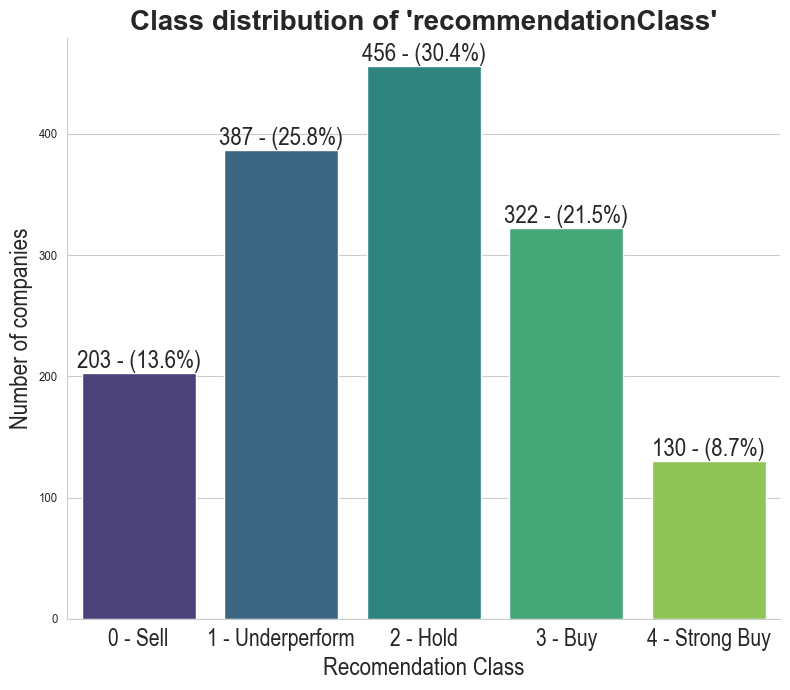

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- 3.1. Análisis del Target (recommendationClass) ---")
print("Estadísticas Descriptivas del Target:")
print(df[TARGET_COL].describe())

print("\nBalance de Clases (Target):")
class_counts = df[TARGET_COL].value_counts().sort_index()
class_balance = df[TARGET_COL].value_counts(normalize=True).mul(100).round(2).sort_index()
print(class_balance.astype(str) + ' %')

# Mapeo de clases a nombres
class_labels = {
    0: "Sell",
    1: "Underperform",
    2: "Hold",
    3: "Buy",
    4: "Strong Buy"
}

# Crear figura
plt.figure(figsize=(8, 7))
ax = sns.countplot(x=df[TARGET_COL], palette='viridis', order=sorted(df[TARGET_COL].unique()))

# Títulos y etiquetas
plt.title(f'Class distribution of \'recommendationClass\'', fontsize=20, weight='bold')
plt.xlabel('Recomendation Class', fontsize=18)
plt.ylabel('Number of companies', fontsize=18)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Reemplazar los valores del eje X con las etiquetas descriptivas
ax.set_xticklabels(
    [f"{i} - {class_labels[i]}" for i in sorted(df[TARGET_COL].unique())],
    fontsize=17
)

# Añadir número de muestras y porcentaje encima de cada barra
for p in ax.patches:
    height = p.get_height()
    class_val = int(p.get_x() + p.get_width() / 2)
    count = int(height)
    pct = class_balance[class_val]
    ax.annotate(f'{count} - ({pct:.1f}%)', 
                (p.get_x() + p.get_width() / 2, height), 
                ha='center', va='bottom', fontsize=18)

plt.tight_layout()
plt.show()
# plt.savefig(os.path.join(output_dir, 'eda_1_target_distribution.png'))
# plt.close()


In [7]:
print("\n--- 3.2. Análisis de Features Numéricas ---")

# --- 3.2.1. Estadísticas Descriptivas (Todas) ---
print("\nEstadísticas Descriptivas de todas las Features Numéricas:")
# .T transpone la salida para que sea más fácil de leer
numeric_summary = df[NUMERIC_FEATURES].describe().T
print(numeric_summary)
# numeric_summary.to_csv(os.path.join(output_dir, 'eda_numeric_summary.csv'))

# --- 3.2.3. Correlación de Numéricas con el Target ---
print("\nCalculando correlación de features numéricas con el target...")
corr_matrix = df[NUMERIC_FEATURES + [TARGET_COL]].corr()
corr_with_target = corr_matrix[TARGET_COL].sort_values(ascending=True)

print(f"\n--- Top 10 Features MÁS correlacionadas con Clase 1 (Mejor Recomendación) ---")
print(corr_with_target.head(10))

print(f"\n--- Top 10 Features MÁS correlacionadas con Clase 5 (Peor Recomendación) ---")
# .drop() para no incluir el target mismo
print(corr_with_target.drop(TARGET_COL).tail(10))


--- 3.2. Análisis de Features Numéricas ---

Estadísticas Descriptivas de todas las Features Numéricas:
                               count            mean              std              min            25%            50%             75%               max
numberOfAnalystOpinions     1498.000          12.675            8.547            1.000          6.000         11.000          17.000            62.000
currentPrice                1498.000         106.801          246.158            0.960         21.185         52.705         126.458          7639.060
allTimeHigh                 1498.000         217.468          773.418           10.500         56.360        101.915         208.585         24500.000
allTimeLow                  1498.000           6.607            9.484        0.000e+00          1.081          3.378           8.258           117.540
beta                        1498.000           1.184            0.701           -6.399          0.810          1.110           1.472        


Generando histogramas para todas las features numéricas...


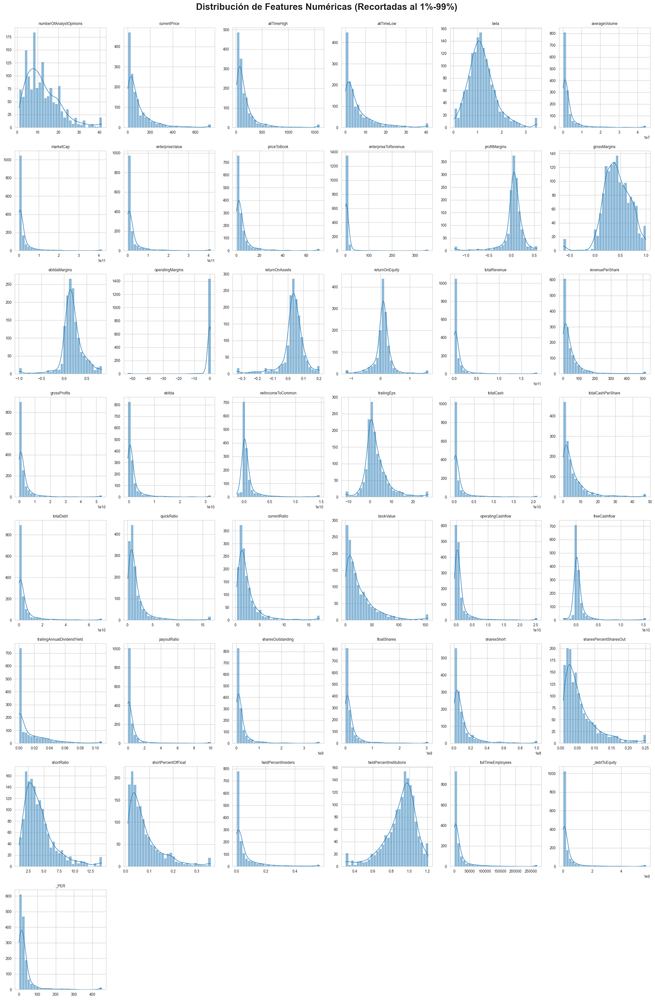

In [8]:
# --- 3.2.2. Distribuciones (Histogramas de Todas) ---
print("\nGenerando histogramas para todas las features numéricas...")
num_cols = 6
num_rows = int(np.ceil(len(NUMERIC_FEATURES) / num_cols))
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 4))
axes = axes.flatten()

for i, col in enumerate(NUMERIC_FEATURES):
    try:
        # Recortar outliers extremos (solo para visualización)
        q_low = df[col].quantile(0.01)
        q_high = df[col].quantile(0.99)
        clipped_data = df[col].clip(q_low, q_high)
        
        sns.histplot(clipped_data, kde=True, ax=axes[i], bins=30, line_kws={'linewidth': 1})
        axes[i].set_title(col, fontsize=10)
        axes[i].set_xlabel('')
        axes[i].set_ylabel('')
    except Exception as e:
        axes[i].set_title(f"{col}\n(Error: {e})", fontsize=10, color='red')

# Ocultar ejes vacíos
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.suptitle('Distribución de Features Numéricas (Recortadas al 1%-99%)', fontsize=20, weight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
# plt.savefig(os.path.join(output_dir, 'eda_2_numeric_distributions.png'))
# plt.close()


Generando grid de 31 filas (8 bloques) y 6 columnas...


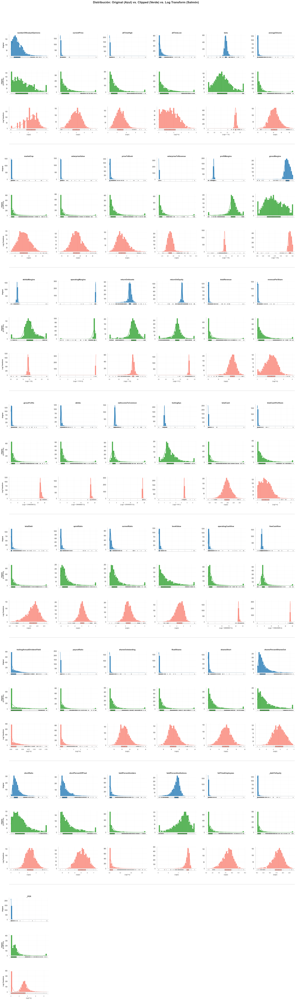

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import math

# --- DEBES DEFINIR ESTAS VARIABLES ---
# El script ahora asume que 'df' y 'NUMERIC_FEATURES' 
# ya existen en tu entorno de ejecución.
# -------------------------------------


# --- Estilo y Parámetros Globales ---
sns.set_theme(style="whitegrid", font_scale=0.95)

cols = 6
num_features = len(NUMERIC_FEATURES)
blocks = math.ceil(num_features / cols) # Número de "meta-filas"

# --- Lógica del Grid con Espaciadores ---
# Cada bloque tiene 3 filas (con, sin, log) y un espaciador (excepto el último)
total_rows = (blocks * 3) + max(0, blocks - 1)
height_ratios = []
for b in range(blocks):
    height_ratios.extend([1, 1, 1]) # Ratios para [con, sin, log]
    if b < blocks - 1:
        height_ratios.extend([0.1]) # Ratio para el espaciador gris

# Paletas
color_with = "#1f77b4"   # azul
color_without = "#2ca02c" # verde
color_log = "#FA8072"      # rojo salmón

# Histogramas más altos respecto al boxplot
plot_height_ratios = [15, 1.2] # Más alto

# --- Figura y Grid ---
# Ajustar altura total de la figura para acomodar espaciadores
fig_height = (blocks * 10.8) + (max(0, blocks - 1) * 1.0) 
fig = plt.figure(figsize=(cols * 4.3, fig_height))
gs_main = fig.add_gridspec(total_rows, cols, hspace=0.65, wspace=0.25, height_ratios=height_ratios)

print(f"Generando grid de {total_rows} filas ({blocks} bloques) y {cols} columnas...")

for vi, col in enumerate(NUMERIC_FEATURES):
    block = vi // cols
    col_pos = vi % cols
    
    # Índices de fila ajustados para el espaciador
    row_con = block * 4
    row_sin = row_con + 1
    row_log = row_con + 2

    # --- Recorte de outliers (para fila 2) ---
    try:
        q_low, q_high = df[col].quantile(0.025), df[col].quantile(0.975)
        clipped = df[col].clip(q_low, q_high)
        clip_error = None
    except Exception as e:
        clipped = df[col] # Fallback
        clip_error = str(e)

    # --- Transformación Logarítmica (para fila 3) ---
    log_data = None
    log_label = "Log(x)"
    log_error = None
    try:
        min_val = df[col].min()
        if min_val > 0:
            log_data = np.log(df[col])
            log_label = "Log(x)"
        elif min_val >= 0:
            log_data = np.log1p(df[col])
            log_label = "Log(1+x)"
        else:
            shift = abs(min_val) + 1
            log_data = np.log(df[col] + shift)
            log_label = f"Log(x + {shift:.1f})"
    except Exception as e:
        log_error = str(e)


    # ===== 1. BLOQUE CON OUTLIERS (Azul) =====
    gs_con = gs_main[row_con, col_pos].subgridspec(2, 1, height_ratios=plot_height_ratios, hspace=0.03)
    ax_hist_with = fig.add_subplot(gs_con[0, 0])
    ax_box_with = fig.add_subplot(gs_con[1, 0], sharex=ax_hist_with)

    try:
        sns.histplot(df[col], kde=True, bins=30, ax=ax_hist_with,
                     color=color_with, alpha=0.85, line_kws={'linewidth': 1.3})
        # Título de la columna, solo en el plot superior
        ax_hist_with.set_title(f"{col}", fontsize=11, weight='semibold', pad=5) 
        ax_hist_with.set_xlabel('')
        ax_hist_with.tick_params(axis='x', bottom=False, labelbottom=False)
        ax_hist_with.grid(alpha=0.15)
        if col_pos == 0:
            ax_hist_with.set_ylabel('Original', fontsize=9, weight='bold', labelpad=6)
        else:
            ax_hist_with.set_ylabel('')
        sns.despine(ax=ax_hist_with)
    except Exception as e:
        ax_hist_with.set_title(f"{col}\n(Error: {e})", fontsize=10, color='red')

    sns.boxplot(x=df[col], ax=ax_box_with, color=color_with, fliersize=2.5, linewidth=0.8, width=0.6)
    ax_box_with.set_yticks([])
    ax_box_with.set_xlabel('')
    ax_box_with.tick_params(axis='x', labelsize=8, bottom=False, labelbottom=False) 
    sns.despine(ax=ax_box_with, left=True, top=True, right=True)


    # ===== 2. BLOQUE SIN OUTLIERS (Verde) =====
    gs_sin = gs_main[row_sin, col_pos].subgridspec(2, 1, height_ratios=plot_height_ratios, hspace=0.03)
    ax_hist_without = fig.add_subplot(gs_sin[0, 0])
    ax_box_without = fig.add_subplot(gs_sin[1, 0], sharex=ax_hist_without)

    try:
        data_to_plot = clipped if clip_error is None else df[col]
        sns.histplot(data_to_plot, kde=True, bins=30, ax=ax_hist_without,
                     color=color_without, alpha=0.85, line_kws={'linewidth': 1.3})
        ax_hist_without.set_title('') # Sin título aquí
        if clip_error:
             ax_hist_without.set_title(f"(Error clip: {clip_error})", fontsize=10, color='red')
        ax_hist_without.set_xlabel('')
        ax_hist_without.tick_params(axis='x', bottom=False, labelbottom=False)
        ax_hist_without.grid(alpha=0.15)
        if col_pos == 0:
            ax_hist_without.set_ylabel('Clipped\n(2.5-97.5%)', fontsize=9, weight='bold', labelpad=6)
        else:
            ax_hist_without.set_ylabel('')
        sns.despine(ax=ax_hist_without)
    except Exception as e:
        ax_hist_without.set_title(f"(Error plot: {e})", fontsize=10, color='red')

    sns.boxplot(x=data_to_plot, ax=ax_box_without, color=color_without, fliersize=2.5, linewidth=0.8, width=0.6)
    ax_box_without.set_yticks([])
    ax_box_without.set_xlabel('')
    ax_box_without.tick_params(axis='x', labelsize=8, bottom=False, labelbottom=False) 
    sns.despine(ax=ax_box_without, left=True, top=True, right=True)


    # ===== 3. BLOQUE CON LOG TRANSFORM (Salmón) =====
    gs_log = gs_main[row_log, col_pos].subgridspec(2, 1, height_ratios=plot_height_ratios, hspace=0.03)
    ax_hist_log = fig.add_subplot(gs_log[0, 0])
    ax_box_log = fig.add_subplot(gs_log[1, 0], sharex=ax_hist_log)

    try:
        if log_error:
            raise Exception(log_error)
        
        sns.histplot(log_data, kde=True, bins=30, ax=ax_hist_log,
                     color=color_log, alpha=0.85, line_kws={'linewidth': 1.3})
        ax_hist_log.set_title('') # Sin título aquí
        ax_hist_log.set_xlabel('')
        ax_hist_log.tick_params(axis='x', bottom=False, labelbottom=False)
        ax_hist_log.grid(alpha=0.15)
        if col_pos == 0:
            ax_hist_log.set_ylabel('Log Transform', fontsize=9, weight='bold', labelpad=6)
        else:
            ax_hist_log.set_ylabel('')
        sns.despine(ax=ax_hist_log)
    except Exception as e:
        ax_hist_log.set_title(f"(Error Log: {e})", fontsize=10, color='red')

    if log_data is not None:
        # --- CORRECCIÓN AQUÍ ---
        # Cambiado de 'ax_log_box' a 'ax_box_log'
        sns.boxplot(x=log_data, ax=ax_box_log, color=color_log, fliersize=2.5, linewidth=0.8, width=0.6)
    
    ax_box_log.set_yticks([])
    # Etiqueta X solo con la transformación, el nombre de la col ya está arriba
    ax_box_log.set_xlabel(f"({log_label})", fontsize=9) 
    ax_box_log.tick_params(axis='x', labelsize=8)
    sns.despine(ax=ax_box_log, left=True, top=True, right=True)


# Ocultar huecos vacíos
for i in range(num_features, blocks * cols):
    block_num = i // cols
    col_num = i % cols
    for row_offset in [0, 1, 2]: # Ocultar las 3 filas de plot
        try:
            ax = fig.add_subplot(gs_main[block_num * 4 + row_offset, col_num])
            ax.set_visible(False)
        except:
            pass

# --- Añadir líneas separadoras ---
for b in range(blocks - 1):
    spacer_row_index = (b * 4) + 3 # Índice de la fila espaciadora
    ax_spacer = fig.add_subplot(gs_main[spacer_row_index, :]) # Span all columns
    ax_spacer.axhline(0.5, color='#CCCCCC', linewidth=1.2)
    ax_spacer.axis('off')

# Título más pegado a los plots
plt.suptitle("Distribución: Original (Azul) vs. Clipped (Verde) vs. Log Transform (Salmón)",
             fontsize=18, weight='bold', y=0.97) 
fig.subplots_adjust(top=0.94, bottom=0.07, left=0.05, right=0.99)

plt.show()



Generando grid de 31 filas (8 bloques) y 6 columnas...


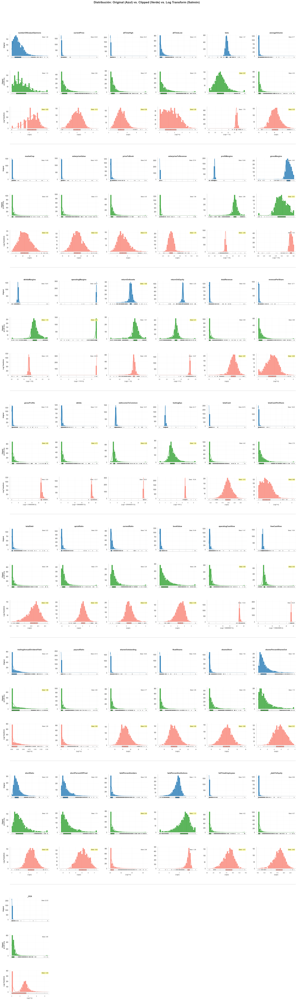


--- Mejor Transformación por Asimetría (Skew) ---
{'numberOfAnalystOpinions': 'LOG', 'currentPrice': 'LOG', 'allTimeHigh': 'LOG', 'allTimeLow': 'LOG', 'beta': 'CLIPPED', 'averageVolume': 'LOG', 'marketCap': 'LOG', 'enterpriseValue': 'LOG', 'priceToBook': 'LOG', 'enterpriseToRevenue': 'LOG', 'profitMargins': 'LOG', 'grossMargins': 'CLIPPED', 'ebitdaMargins': 'CLIPPED', 'operatingMargins': 'CLIPPED', 'returnOnAssets': 'ORIGINAL', 'returnOnEquity': 'CLIPPED', 'totalRevenue': 'LOG', 'revenuePerShare': 'LOG', 'grossProfits': 'CLIPPED', 'ebitda': 'CLIPPED', 'netIncomeToCommon': 'CLIPPED', 'trailingEps': 'CLIPPED', 'totalCash': 'LOG', 'totalCashPerShare': 'LOG', 'totalDebt': 'LOG', 'quickRatio': 'LOG', 'currentRatio': 'LOG', 'bookValue': 'LOG', 'operatingCashflow': 'CLIPPED', 'freeCashflow': 'CLIPPED', 'trailingAnnualDividendYield': 'CLIPPED', 'payoutRatio': 'LOG', 'sharesOutstanding': 'LOG', 'floatShares': 'LOG', 'sharesShort': 'LOG', 'sharesPercentSharesOut': 'LOG', 'shortRatio': 'LOG', 's

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import math
import pandas as pd

percentage_out =0.01

sns.set_theme(style="whitegrid", font_scale=0.95)

cols = 6
num_features = len(NUMERIC_FEATURES)
blocks = math.ceil(num_features / cols) 

total_rows = (blocks * 3) + max(0, blocks - 1)
height_ratios = []
for b in range(blocks):
    height_ratios.extend([1, 1, 1])
    if b < blocks - 1:
        height_ratios.extend([0.1]) 

color_with = "#1f77b4"
color_without = "#2ca02c"
color_log = "#FA8072"

plot_height_ratios = [15, 1.2]

best_transformations = {}
transform_map = {
    'Original': 'ORIGINAL',
    'Clipped': 'CLIPPED',
    'Log': 'LOG'
}

fig_height = (blocks * 10.8) + (max(0, blocks - 1) * 1.0) 
fig = plt.figure(figsize=(cols * 4.3, fig_height))
gs_main = fig.add_gridspec(total_rows, cols, hspace=0.65, wspace=0.25, height_ratios=height_ratios)

print(f"Generando grid de {total_rows} filas ({blocks} bloques) y {cols} columnas...")

for vi, col in enumerate(NUMERIC_FEATURES):
    block = vi // cols
    col_pos = vi % cols
    
    row_con = block * 4
    row_sin = row_con + 1
    row_log = row_con + 2

    try:
        q_low, q_high = df[col].quantile(percentage_out), df[col].quantile(1-percentage_out)
        clipped = df[col].clip(q_low, q_high)
        clip_error = None
    except Exception as e:
        clipped = df[col] 
        clip_error = str(e)

    log_data = None
    log_label = "Log(x)"
    log_error = None
    try:
        min_val = df[col].min()
        if min_val > 0:
            log_data = np.log(df[col])
            log_label = "Log(x)"
        elif min_val >= 0:
            log_data = np.log1p(df[col])
            log_label = "Log(1+x)"
        else:
            shift = abs(min_val) + 1
            log_data = np.log(df[col] + shift)
            log_label = f"Log(x + {shift:.1f})"
    except Exception as e:
        log_error = str(e)

    skew_orig = df[col].skew()
    skew_clip = clipped.skew()
    skew_log = log_data.skew() if (log_data is not None and pd.notna(log_data).all()) else np.nan

    skews = {
        'Original': skew_orig,
        'Clipped': skew_clip,
        'Log': skew_log
    }
    
    valid_skews = {k: v for k, v in skews.items() if pd.notna(v)}
    best_method = min(valid_skews, key=lambda k: abs(valid_skews[k])) if valid_skews else None

    best_transformations[col] = transform_map.get(best_method, 'None')
    
    bbox_props_best = dict(boxstyle="round,pad=0.3", fc="#FFFF99", ec="none", alpha=0.8)
    bbox_props_default = dict(boxstyle="round,pad=0.3", fc="white", ec="none", alpha=0.6)

    gs_con = gs_main[row_con, col_pos].subgridspec(2, 1, height_ratios=plot_height_ratios, hspace=0.03)
    ax_hist_with = fig.add_subplot(gs_con[0, 0])
    ax_box_with = fig.add_subplot(gs_con[1, 0], sharex=ax_hist_with)

    try:
        sns.histplot(df[col], kde=True, bins=30, ax=ax_hist_with,
                     color=color_with, alpha=0.85, line_kws={'linewidth': 1.3})
        ax_hist_with.set_title(f"{col}", fontsize=11, weight='semibold', pad=5) 
        ax_hist_with.set_xlabel('')
        ax_hist_with.tick_params(axis='x', bottom=False, labelbottom=False)
        ax_hist_with.grid(alpha=0.15)
        if col_pos == 0:
            ax_hist_with.set_ylabel('Original', fontsize=9, weight='bold', labelpad=6)
        else:
            ax_hist_with.set_ylabel('')
        sns.despine(ax=ax_hist_with)
        
        bbox = bbox_props_best if best_method == 'Original' else bbox_props_default
        ax_hist_with.text(0.97, 0.9, f"Skew: {skew_orig:.2f}", transform=ax_hist_with.transAxes, ha='right', va='top', fontsize=9, bbox=bbox)
        
    except Exception as e:
        ax_hist_with.set_title(f"{col}\n(Error: {e})", fontsize=10, color='red')

    sns.boxplot(x=df[col], ax=ax_box_with, color=color_with, fliersize=2.5, linewidth=0.8, width=0.6)
    ax_box_with.set_yticks([])
    ax_box_with.set_xlabel('')
    ax_box_with.tick_params(axis='x', labelsize=8, bottom=False, labelbottom=False) 
    sns.despine(ax=ax_box_with, left=True, top=True, right=True)

    gs_sin = gs_main[row_sin, col_pos].subgridspec(2, 1, height_ratios=plot_height_ratios, hspace=0.03)
    ax_hist_without = fig.add_subplot(gs_sin[0, 0])
    ax_box_without = fig.add_subplot(gs_sin[1, 0], sharex=ax_hist_without)

    try:
        data_to_plot = clipped if clip_error is None else df[col]
        sns.histplot(data_to_plot, kde=True, bins=30, ax=ax_hist_without,
                     color=color_without, alpha=0.85, line_kws={'linewidth': 1.3})
        ax_hist_without.set_title('') 
        if clip_error:
             ax_hist_without.set_title(f"(Error clip: {clip_error})", fontsize=10, color='red')
        ax_hist_without.set_xlabel('')
        ax_hist_without.tick_params(axis='x', bottom=False, labelbottom=False)
        ax_hist_without.grid(alpha=0.15)
        if col_pos == 0:
            ax_hist_without.set_ylabel('Clipped\n(2.5-97.5%)', fontsize=9, weight='bold', labelpad=6)
        else:
            ax_hist_without.set_ylabel('')
        sns.despine(ax=ax_hist_without)

        bbox = bbox_props_best if best_method == 'Clipped' else bbox_props_default
        ax_hist_without.text(0.97, 0.9, f"Skew: {skew_clip:.2f}", transform=ax_hist_without.transAxes, ha='right', va='top', fontsize=9, bbox=bbox)

    except Exception as e:
        ax_hist_without.set_title(f"(Error plot: {e})", fontsize=10, color='red')

    sns.boxplot(x=data_to_plot, ax=ax_box_without, color=color_without, fliersize=2.5, linewidth=0.8, width=0.6)
    ax_box_without.set_yticks([])
    ax_box_without.set_xlabel('')
    ax_box_without.tick_params(axis='x', labelsize=8, bottom=False, labelbottom=False) 
    sns.despine(ax=ax_box_without, left=True, top=True, right=True)

    gs_log = gs_main[row_log, col_pos].subgridspec(2, 1, height_ratios=plot_height_ratios, hspace=0.03)
    ax_hist_log = fig.add_subplot(gs_log[0, 0])
    ax_box_log = fig.add_subplot(gs_log[1, 0], sharex=ax_hist_log)

    try:
        if log_error:
            raise Exception(log_error)
        
        sns.histplot(log_data, kde=True, bins=30, ax=ax_hist_log,
                     color=color_log, alpha=0.85, line_kws={'linewidth': 1.3})
        ax_hist_log.set_title('') 
        ax_hist_log.set_xlabel('')
        ax_hist_log.tick_params(axis='x', bottom=False, labelbottom=False)
        ax_hist_log.grid(alpha=0.15)
        if col_pos == 0:
            ax_hist_log.set_ylabel('Log Transform', fontsize=9, weight='bold', labelpad=6)
        else:
            ax_hist_log.set_ylabel('')
        sns.despine(ax=ax_hist_log)

        if pd.notna(skew_log):
            bbox = bbox_props_best if best_method == 'Log' else bbox_props_default
            ax_hist_log.text(0.97, 0.9, f"Skew: {skew_log:.2f}", transform=ax_hist_log.transAxes, ha='right', va='top', fontsize=9, bbox=bbox)

    except Exception as e:
        ax_hist_log.set_title(f"(Error Log: {e})", fontsize=10, color='red')

    if log_data is not None:
        sns.boxplot(x=log_data, ax=ax_box_log, color=color_log, fliersize=2.5, linewidth=0.8, width=0.6)
    
    ax_box_log.set_yticks([])
    ax_box_log.set_xlabel(f"({log_label})", fontsize=9) 
    ax_box_log.tick_params(axis='x', labelsize=8)
    sns.despine(ax=ax_box_log, left=True, top=True, right=True)

for i in range(num_features, blocks * cols):
    block_num = i // cols
    col_num = i % cols
    for row_offset in [0, 1, 2]:
        try:
            ax = fig.add_subplot(gs_main[block_num * 4 + row_offset, col_num])
            ax.set_visible(False)
        except:
            pass

for b in range(blocks - 1):
    spacer_row_index = (b * 4) + 3
    ax_spacer = fig.add_subplot(gs_main[spacer_row_index, :])
    ax_spacer.axhline(0.5, color='#CCCCCC', linewidth=1.2)
    ax_spacer.axis('off')

plt.suptitle("Distribución: Original (Azul) vs. Clipped (Verde) vs. Log Transform (Salmón)",
             fontsize=18, weight='bold', y=0.97) 
fig.subplots_adjust(top=0.94, bottom=0.07, left=0.05, right=0.99)

plt.show()

print("\n--- Mejor Transformación por Asimetría (Skew) ---")
print(best_transformations)


--- 3.2.3. Distribuciones por Clase del Target ---


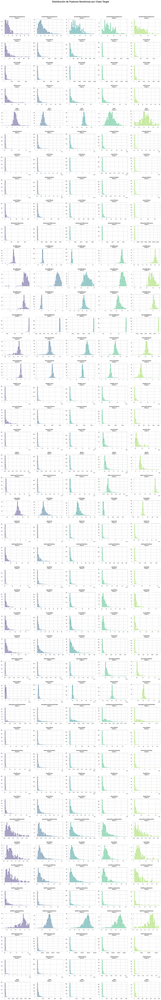

In [11]:
# ======================================================
# FIGURA 2 — Distribuciones por clase del target
# ======================================================
print("\n--- 3.2.3. Distribuciones por Clase del Target ---")

unique_classes = sorted(df[TARGET_COL].unique())
palette = sns.color_palette('viridis', n_colors=len(unique_classes))
cols_per_row = len(unique_classes)  # 5 si las clases son 0–4

fig, axes = plt.subplots(len(NUMERIC_FEATURES), cols_per_row, figsize=(cols_per_row * 4, len(NUMERIC_FEATURES) * 3))
if len(NUMERIC_FEATURES) == 1:
    axes = np.array([axes])

for i, col in enumerate(NUMERIC_FEATURES):
    for j, target_val in enumerate(unique_classes):
        subset = df[df[TARGET_COL] == target_val][col]
        sns.histplot(subset, kde=True, bins=30, ax=axes[i, j], color=palette[j], line_kws={'linewidth': 1})
        axes[i, j].set_title(f"{col}\nClase {target_val}", fontsize=11, weight='bold')
        axes[i, j].set_xlabel('')
        axes[i, j].set_ylabel('')

plt.suptitle("Distribución de Features Numéricas por Clase Target", fontsize=20, weight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()
# plt.savefig(os.path.join(output_dir, 'eda_3_numeric_by_target.png'))
# plt.close()


In [12]:
print("\n--- 3.3. Análisis features categóricas ---")

for col in CATEGORICAL_FEATURES:
    n_unique = df[col].nunique()
    print(f"\n--- Análisis Categórico: '{col}' (Categorías únicas: {n_unique}) ---")
    
    # Imprimir distribución de la categoría
    print(f"Distribución de '{col}':")
    print(df[col].value_counts(normalize=True).mul(100).round(2).head(15).astype(str) + ' %')

    # Graficar solo si tiene sentido (ni 1 categoría, ni > 50)
    if 1 < n_unique <= 50:
        plt.figure(figsize=(12, 7))
        
        try:
            sns.boxplot(data=df, x=TARGET_COL, y=col, color="skyblue")
            
            plt.title(f"Relación entre '{col}' y '{TARGET_COL}'", fontsize=14, weight='bold')
            plt.xlabel(f'Clase Target ({TARGET_COL})', fontsize=12)
            plt.ylabel(col, fontsize=12)
            # plt.savefig(os.path.join(output_dir, f'eda_3_cat_{col}_vs_target.png'))
            plt.close()

        except Exception as e:
            # Captura general por si el ploteo falla por otra razón
            print(f"ERROR: No se pudo plotear '{col}'. Saltando. (Error: {e})")
            plt.close() # Asegurarse de cerrar la figura vacía
        
    else:
        print(f"Omitiendo gráfico para '{col}' (demasiadas o muy pocas categorías).")


--- 3.3. Análisis features categóricas ---

--- Análisis Categórico: 'sector' (Categorías únicas: 11) ---
Distribución de 'sector':
sector
Industrials               16.76 %
Healthcare                16.62 %
Technology                16.42 %
Consumer Cyclical         13.08 %
Real Estate                7.48 %
Financial Services         7.34 %
Energy                     5.74 %
Basic Materials            4.94 %
Consumer Defensive         4.87 %
Communication Services      3.6 %
Utilities                  3.14 %
Name: proportion, dtype: object

--- Análisis Categórico: 'state' (Categorías únicas: 52) ---
Distribución de 'state':
state
CA     16.36 %
TX      9.21 %
NY      7.48 %
MA      6.14 %
UNK     4.81 %
FL      4.47 %
IL      4.47 %
PA      4.21 %
GA      3.14 %
OH      2.94 %
VA      2.94 %
NJ       2.8 %
CO      2.47 %
NC      2.14 %
MN       2.0 %
Name: proportion, dtype: object
Omitiendo gráfico para 'state' (demasiadas o muy pocas categorías).

--- Análisis Categórico: 'In_SP500'


--- 3.4. Análisis de Multicolinealidad (Numérica vs Numérica) ---
Top 15 Pares de Features con Mayor Correlación (Potencial Multicolinealidad):
ebitda                  operatingCashflow     0.988
marketCap               enterpriseValue       0.982
sharesOutstanding       floatShares           0.974
ebitda                  netIncomeToCommon     0.959
netIncomeToCommon       operatingCashflow     0.958
grossProfits            ebitda                0.942
                        operatingCashflow     0.942
quickRatio              currentRatio          0.934
enterpriseToRevenue     operatingMargins      0.911
grossProfits            netIncomeToCommon     0.896
netIncomeToCommon       freeCashflow          0.896
currentPrice            trailingEps           0.891
enterpriseValue         ebitda                0.889
sharesPercentSharesOut  shortPercentOfFloat   0.888
enterpriseValue         netIncomeToCommon     0.882
dtype: float64


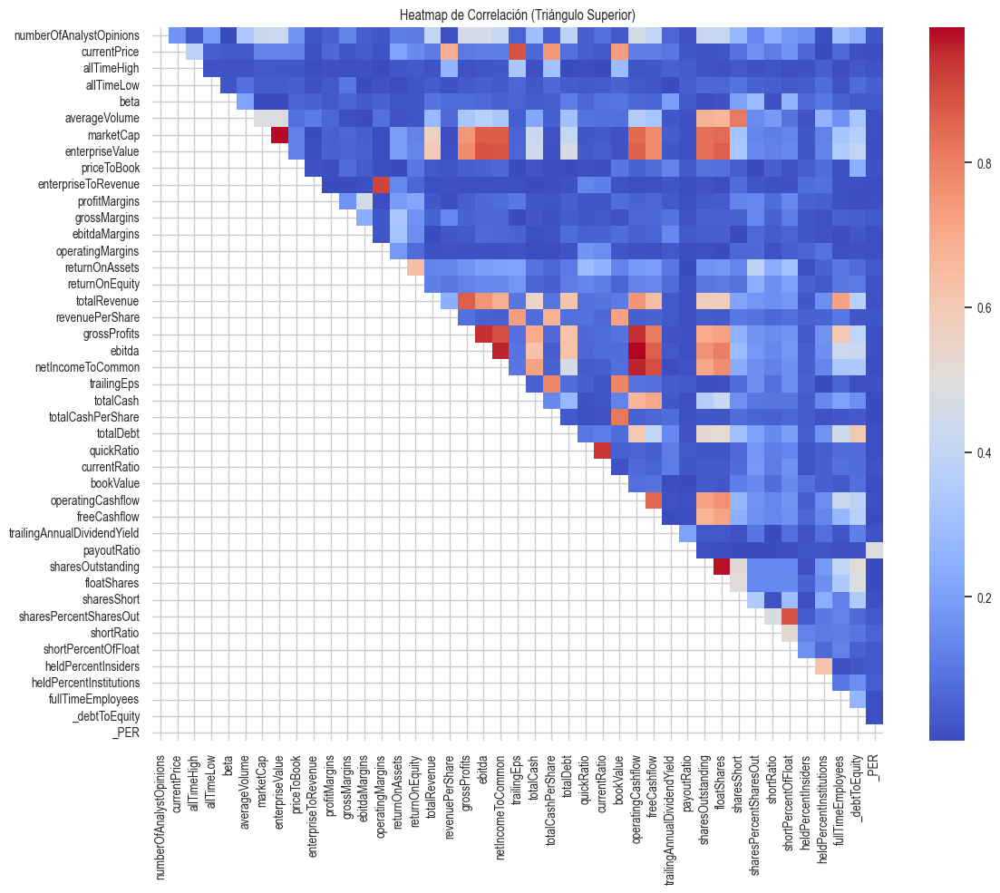

In [13]:
print("\n--- 3.4. Análisis de Multicolinealidad (Numérica vs Numérica) ---")

# Calcular matriz de correlación
corr_matrix_features = df[NUMERIC_FEATURES].corr().abs()

# Usar una máscara para obtener solo el triángulo superior (evitar duplicados)
upper_triangle_mask = np.triu(np.ones(corr_matrix_features.shape), k=1).astype(bool)
upper_triangle = corr_matrix_features.where(upper_triangle_mask)

# "Apilar" la matriz para convertirla en una serie y ordenarla
stacked_corr = upper_triangle.stack().sort_values(ascending=False)

print("Top 15 Pares de Features con Mayor Correlación (Potencial Multicolinealidad):")
print(stacked_corr.head(15))

# --- Representación gráfica ---
plt.figure(figsize=(12, 10))
sns.heatmap(
    corr_matrix_features, 
    annot=False, 
    fmt=".2f",
    cbar=True,
    cmap="coolwarm", 
    mask=np.tril(np.ones_like(corr_matrix_features, dtype=bool))
)
plt.title("Heatmap de Correlación (Triángulo Superior)")
plt.show()


--- 3.5. Análisis de Interacción (Numérico vs Categórico) ---


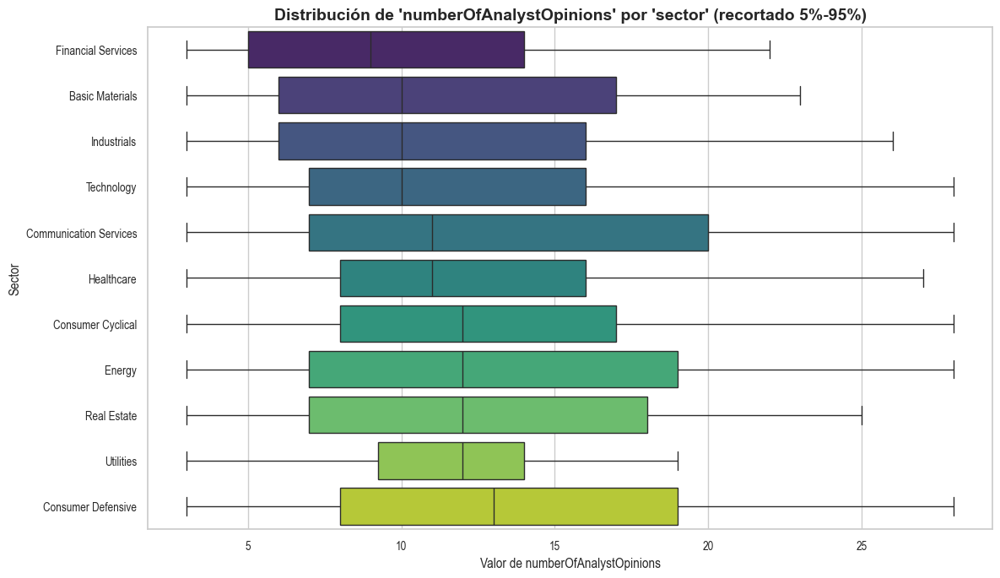

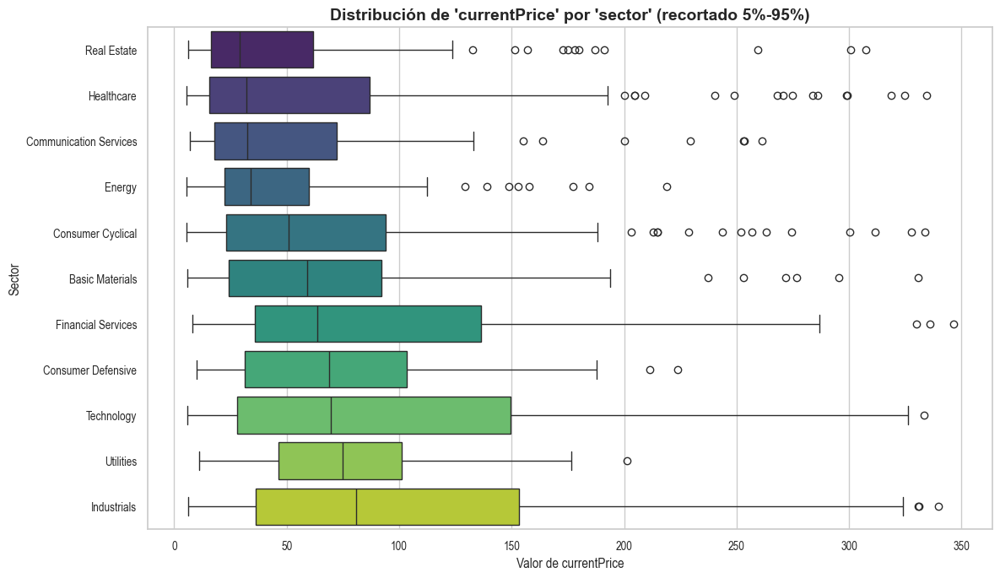

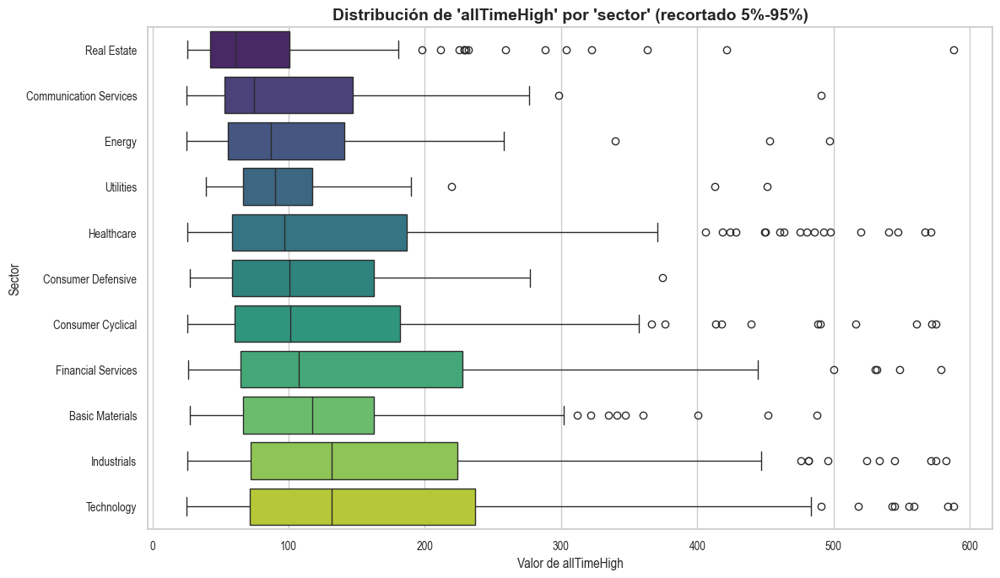

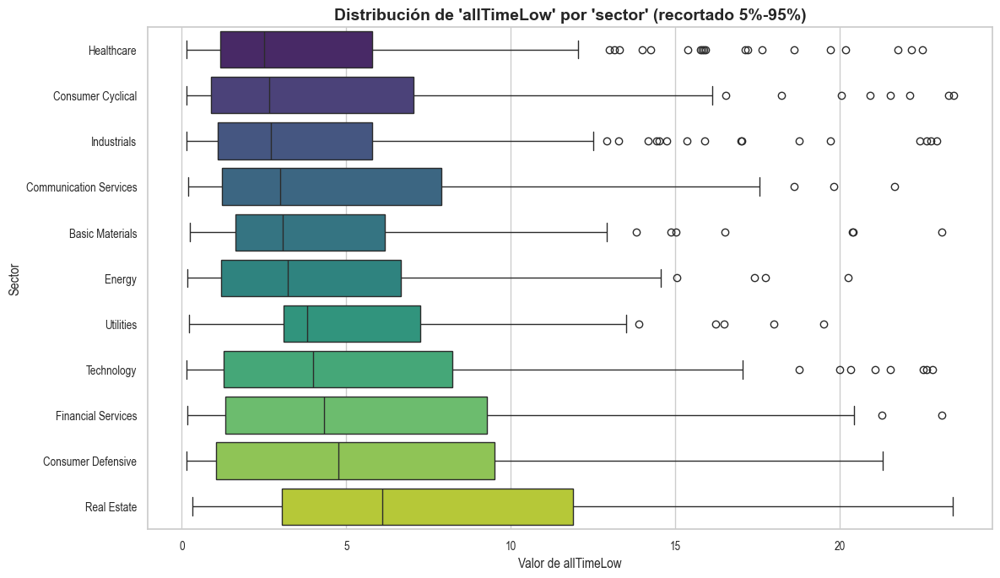

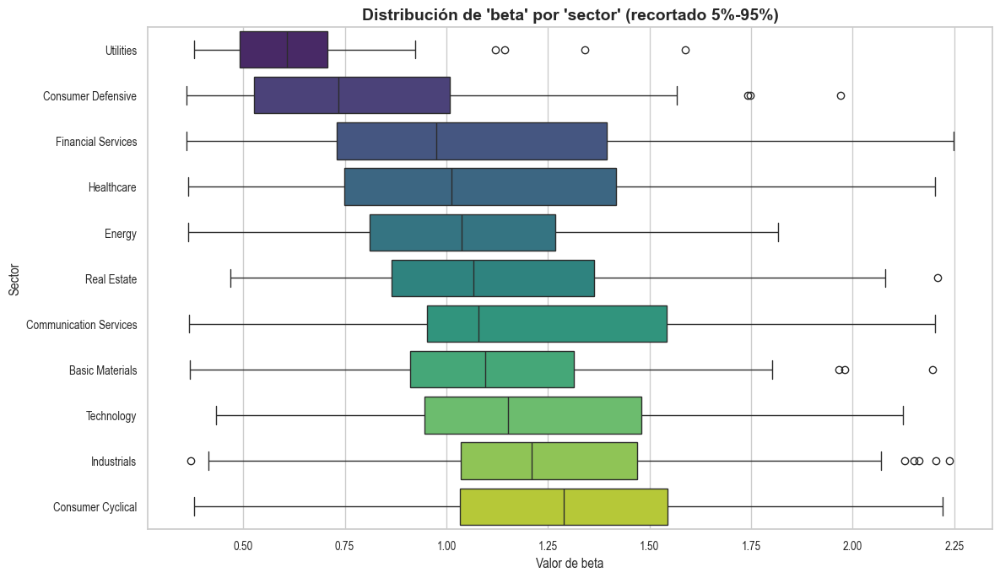

...

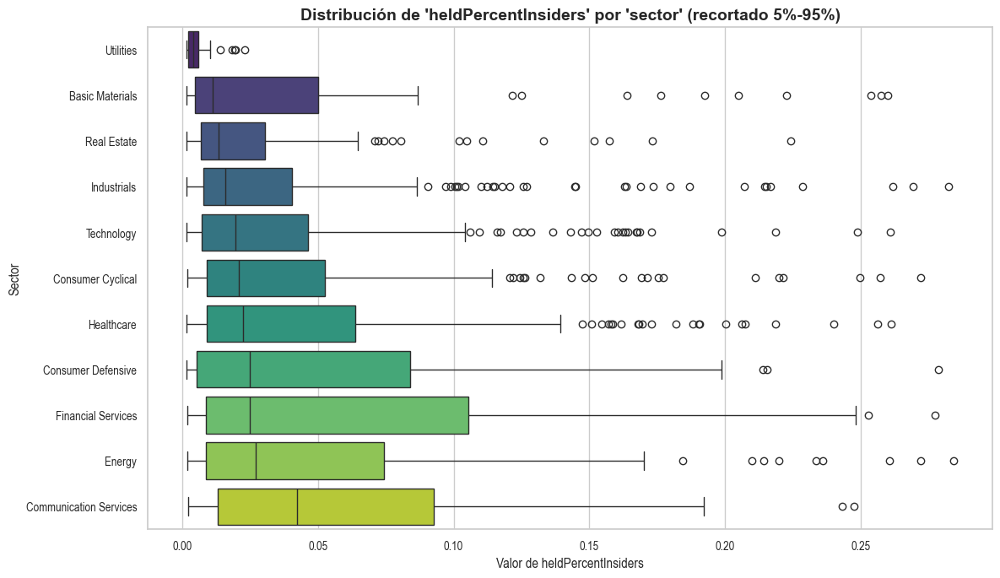

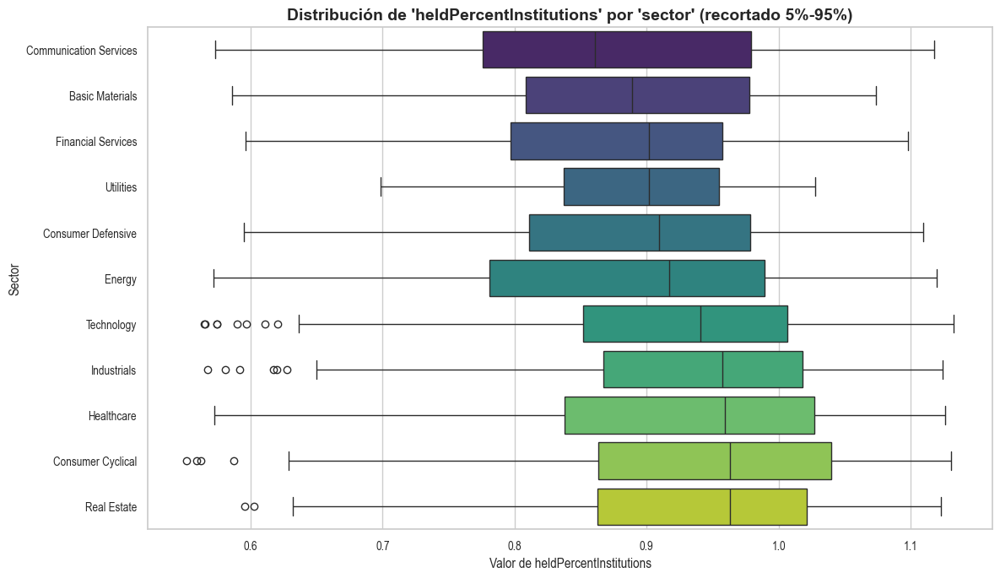

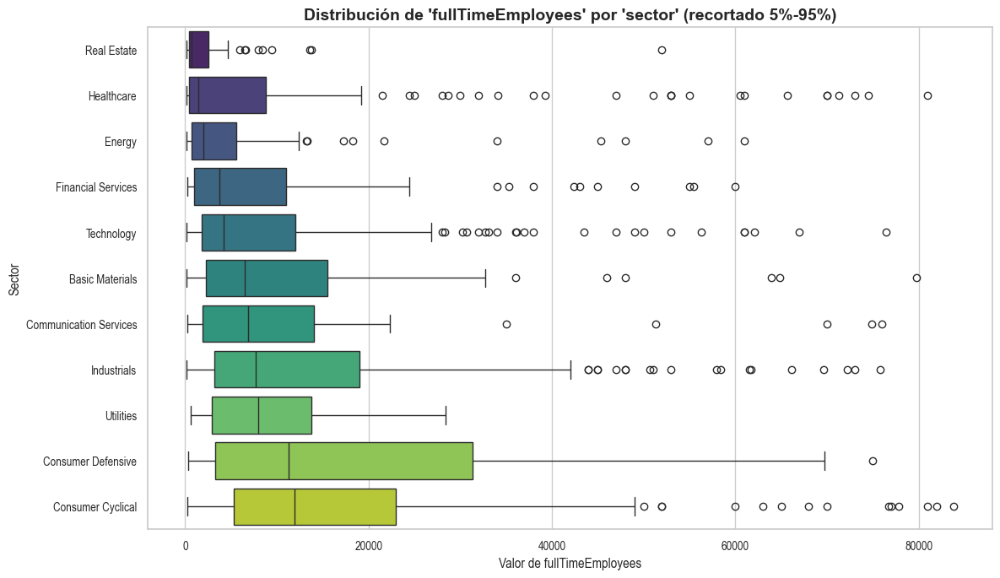

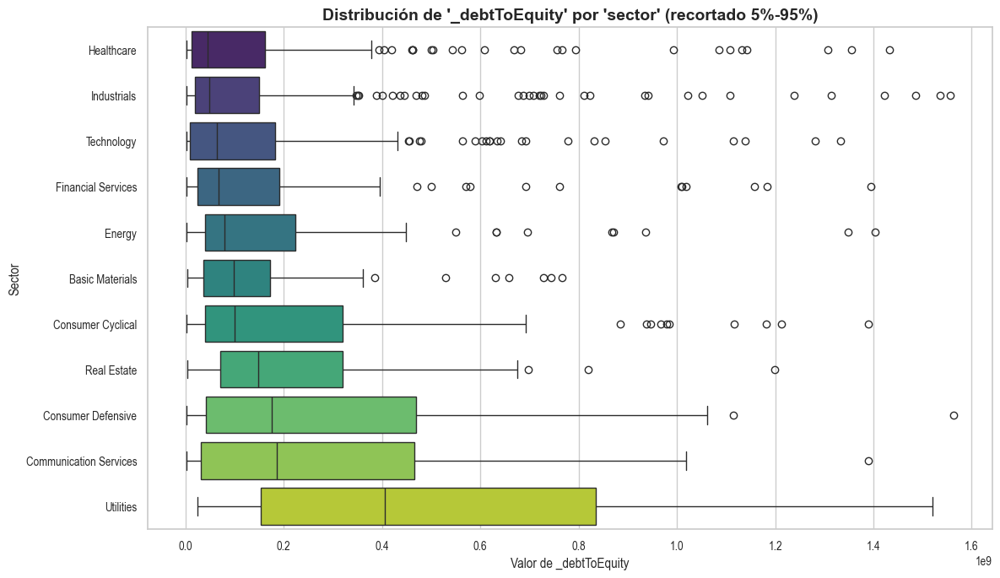

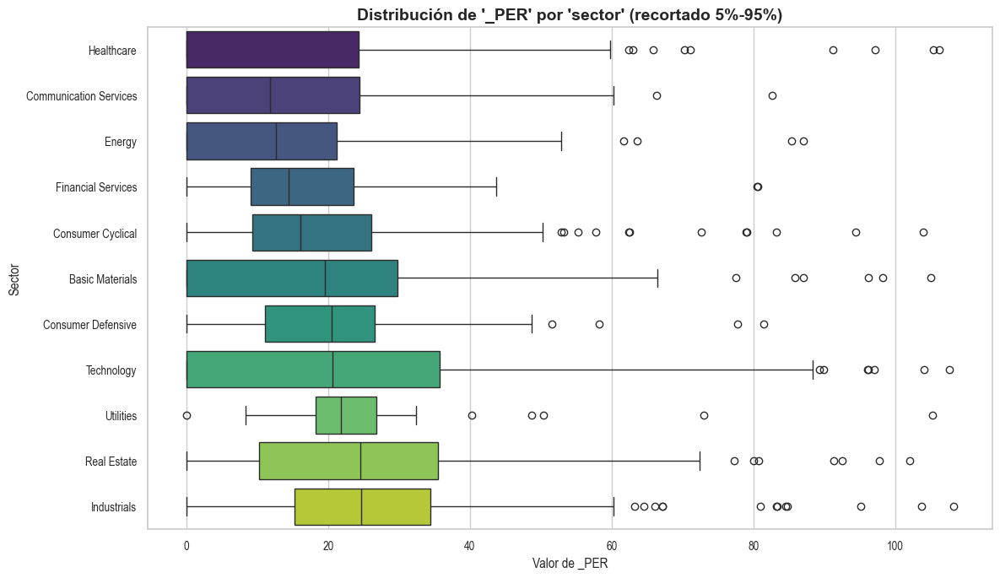

In [14]:
print("\n--- 3.5. Análisis de Interacción (Numérico vs Categórico) ---")

col = 'sector'  # Columna categórica clave para análisis de interacción 
for num_col in NUMERIC_FEATURES:
    if num_col in df.columns:
        plt.figure(figsize=(12, 7))
        
        # Recortar outliers para el gráfico
        q_low = df[num_col].quantile(0.05)
        q_high = df[num_col].quantile(0.95)
        df_clipped = df[(df[num_col] >= q_low) & (df[num_col] <= q_high)]
        
        # Ordenar sectores por mediana
        order = df_clipped.groupby(col)[num_col].median().sort_values().index

        sns.boxplot(data=df_clipped, x=num_col, y=col, order=order, palette='viridis')
        plt.title(f"Distribución de '{num_col}' por '{col}' (recortado 5%-95%)", fontsize=14, weight='bold')
        plt.xlabel(f'Valor de {num_col}', fontsize=12)
        plt.ylabel('Sector', fontsize=12)
        # plt.savefig(os.path.join(output_dir, f'eda_4_interaction_{num_col}_vs_{col}.png'))
        # plt.close()

#### PASO 4: PREPROCESAMIENTO DE DATOS E INGENIERÍA DE CARACTERÍSTICAS

Eliminamos columnas que no aportan información por la alta multicolinearidad, eliminamos outliers...


In [15]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import VarianceThreshold
from sklearn.pipeline import Pipeline
from statsmodels.stats.outliers_influence import variance_inflation_factor

print("\n--- INICIANDO PRE-PROCESAMIENTO AVANZADO DE DATOS ---")
print("\n--- Paso 1: Eliminando features de Varianza Cero ---")

low_variance_cats = []
for col in CATEGORICAL_FEATURES:
    if X[col].nunique() == 1:
        low_variance_cats.append(col)
        
if low_variance_cats:
    print(f"Eliminando categóricas de varianza cero: {low_variance_cats}")
    X = X.drop(columns=low_variance_cats)
    CATEGORICAL_FEATURES = [col for col in CATEGORICAL_FEATURES if col not in low_variance_cats]

selector = VarianceThreshold(threshold=0)
selector.fit(X[NUMERIC_FEATURES])

retained_cols_mask = selector.get_support()
dropped_cols = X[NUMERIC_FEATURES].columns[~retained_cols_mask]

if len(dropped_cols) > 0:
    print(f"Eliminando numéricas de varianza cero: {list(dropped_cols)}")
    X = X.drop(columns=dropped_cols)
    NUMERIC_FEATURES = [col for col in NUMERIC_FEATURES if col not in dropped_cols]

print(f"Features restantes: {X.shape[1]}")


--- INICIANDO PRE-PROCESAMIENTO AVANZADO DE DATOS ---

--- Paso 1: Eliminando features de Varianza Cero ---
Eliminando categóricas de varianza cero: ['is_Insolvent']
Features restantes: 48


In [16]:
print("\n--- Paso 2: Tratando Asimetría Extrema (Log-Transform) ---")
# Los datos financieros (ej. marketCap) suelen tener una asimetría extrema
# Un log-transform ayuda a normalizarlos y controla outliers

skew_limit = 2.0 # Umbral alto
skewed_cols = []

for col in NUMERIC_FEATURES:
    # Asegurarse de que todos los datos sean > 0 para log
    if (X[col] > 0).all():
        skewness = X[col].skew()
        if abs(skewness) > skew_limit:
            skewed_cols.append(col)
            # np.log1p es log(1+x), que maneja ceros de forma segura
            X[col] = np.log1p(X[col])

print(f"Columnas tratadas con Log-Transform (skew > {skew_limit}): {skewed_cols}")



--- Paso 2: Tratando Asimetría Extrema (Log-Transform) ---
Columnas tratadas con Log-Transform (skew > 2.0): ['currentPrice', 'allTimeHigh', 'averageVolume', 'marketCap', 'enterpriseValue', 'priceToBook', 'enterpriseToRevenue', 'totalRevenue', 'totalCash', 'totalDebt', 'quickRatio', 'currentRatio', 'bookValue', 'sharesOutstanding', 'floatShares', 'sharesShort', 'shortRatio', 'shortPercentOfFloat', 'fullTimeEmployees', '_debtToEquity']


Ojo aquí porque estamos realizando una técnica conocida como clipping o windsorization


--- Paso 3: Tratando Outliers Extremos (Clipping 1% - 99%) ---
  -> Recortando 15 outliers en 'numberOfAnalystOpinions'. Generando gráfico...
  -> Recortando 30 outliers en 'currentPrice'. Generando gráfico...
  -> Recortando 30 outliers en 'allTimeHigh'. Generando gráfico...
  -> Recortando 30 outliers en 'allTimeLow'. Generando gráfico...
  -> Recortando 30 outliers en 'beta'. Generando gráfico...
  -> Recortando 30 outliers en 'averageVolume'. Generando gráfico...
  -> Recortando 30 outliers en 'marketCap'. Generando gráfico...
  -> Recortando 30 outliers en 'enterpriseValue'. Generando gráfico...
  -> Recortando 30 outliers en 'priceToBook'. Generando gráfico...
  -> Recortando 30 outliers en 'enterpriseToRevenue'. Generando gráfico...
  -> Recortando 30 outliers en 'profitMargins'. Generando gráfico...
  -> Recortando 15 outliers en 'grossMargins'. Generando gráfico...
  -> Recortando 30 outliers en 'ebitdaMargins'. Generando gráfico...
  -> Recortando 30 outliers en 'operatingMa

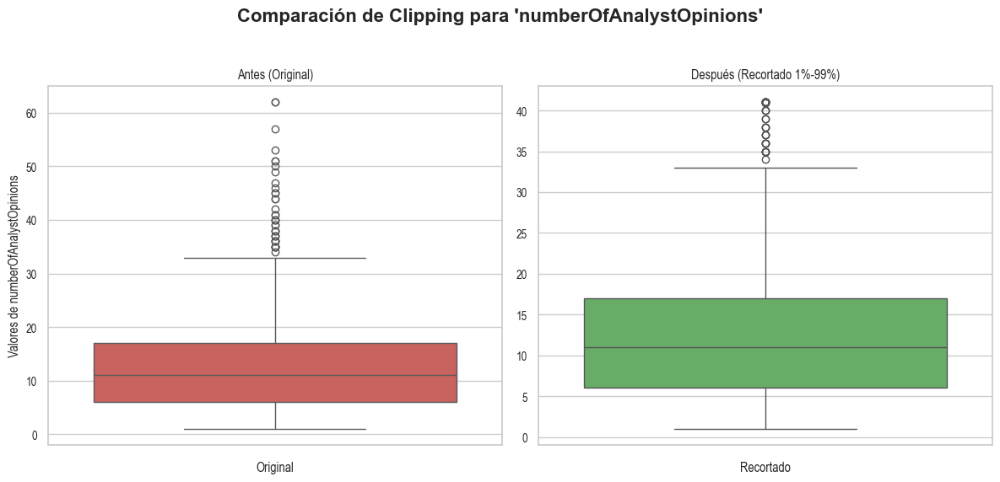

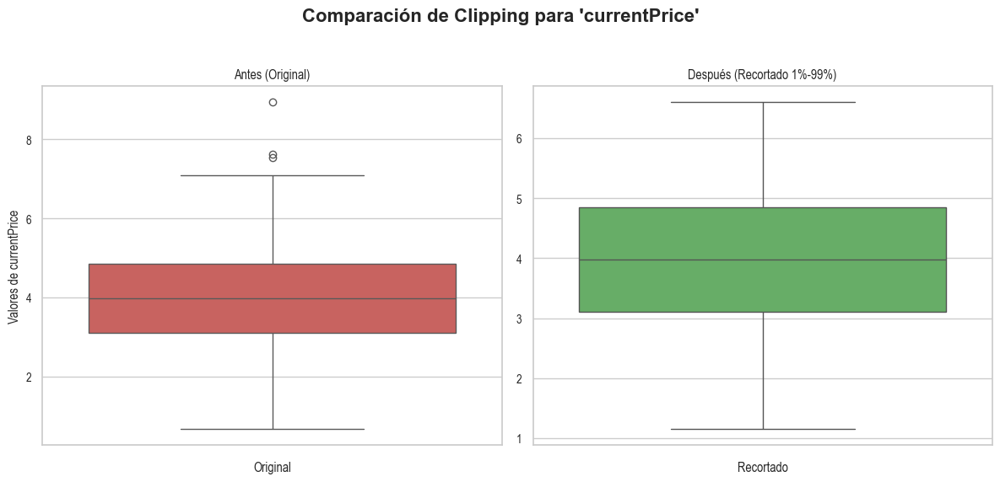

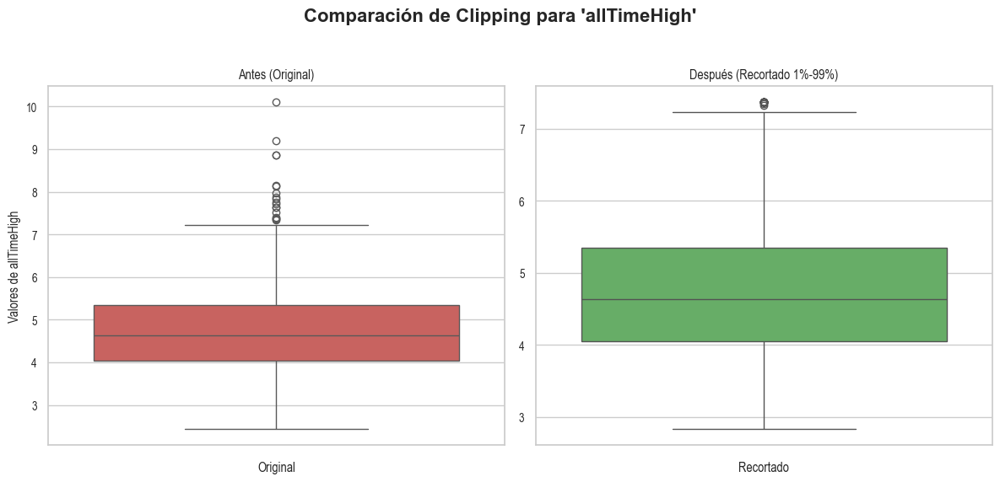

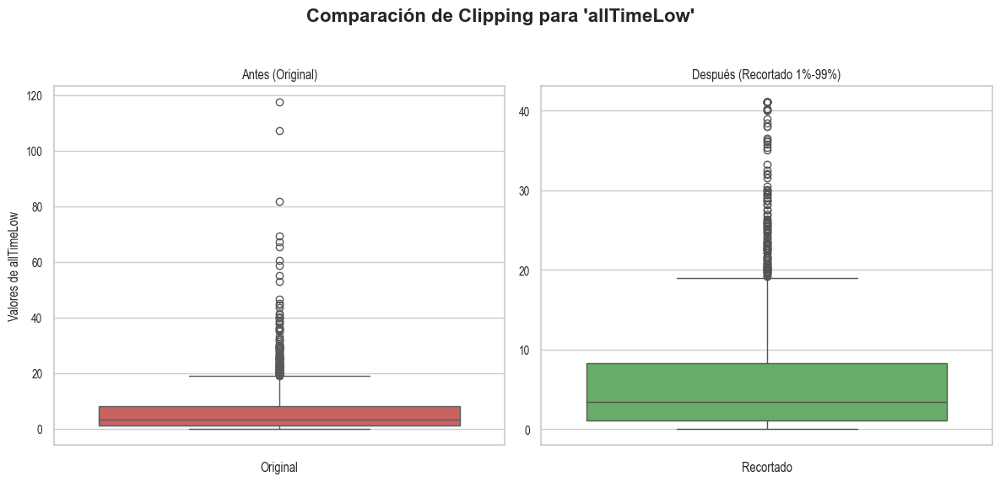

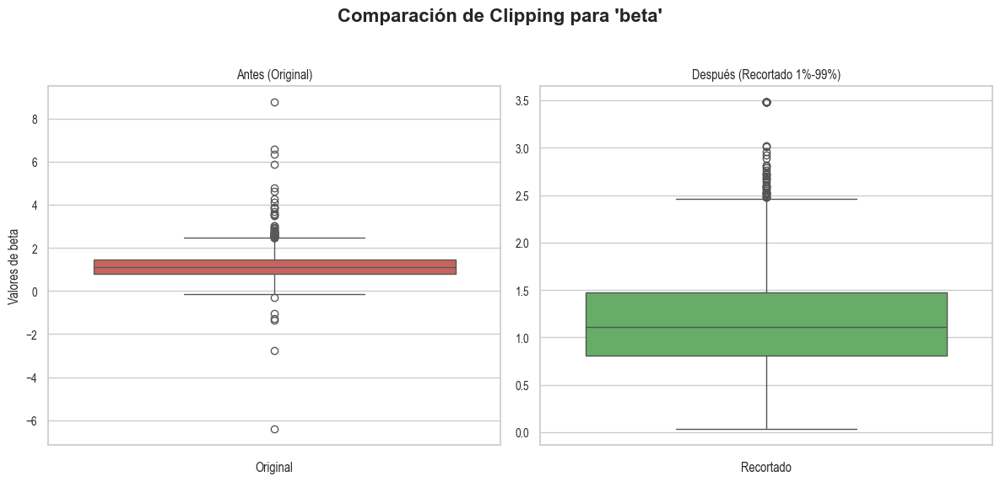

...

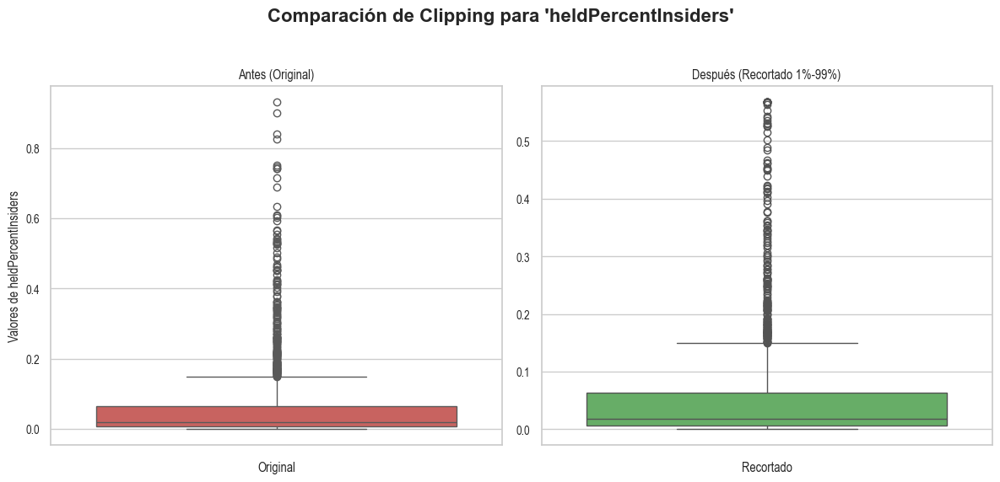

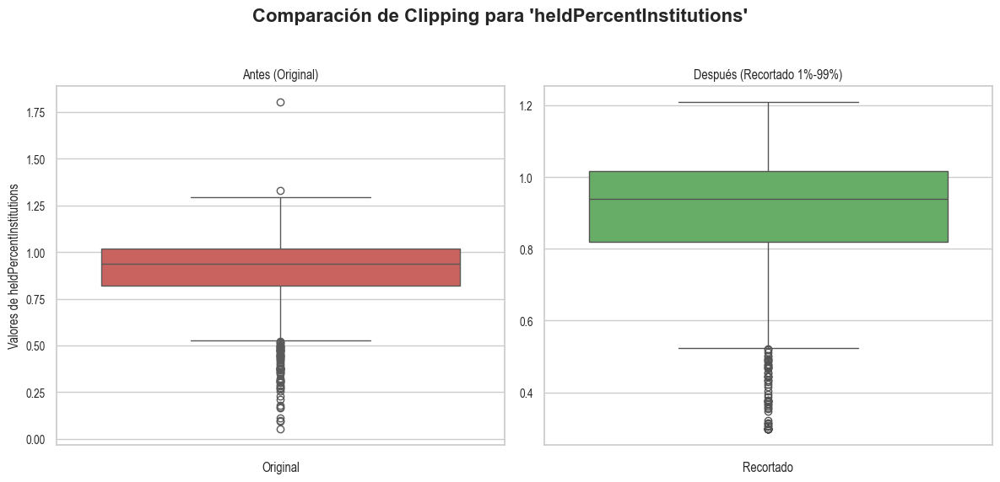

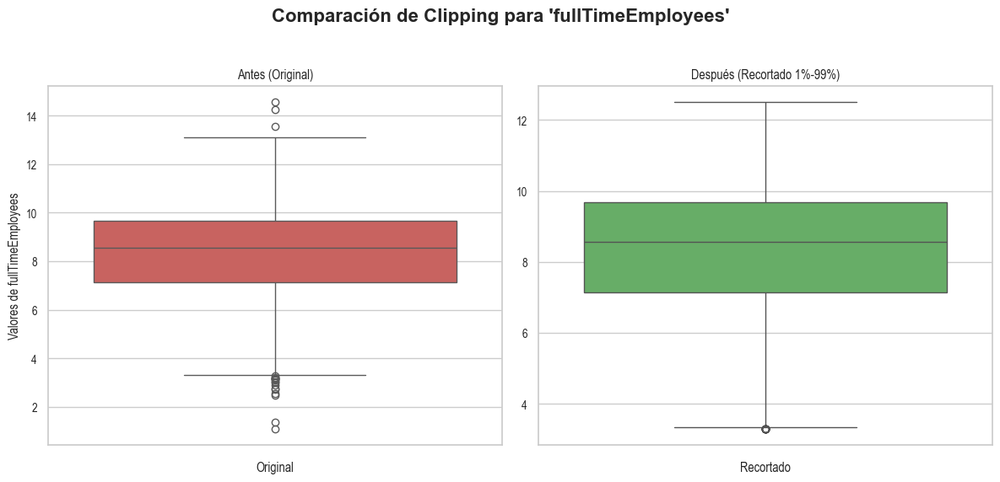

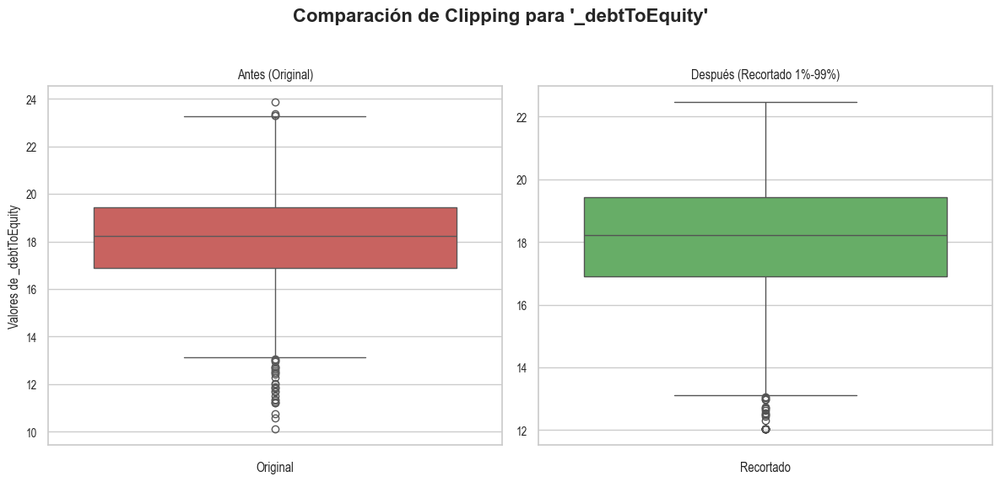

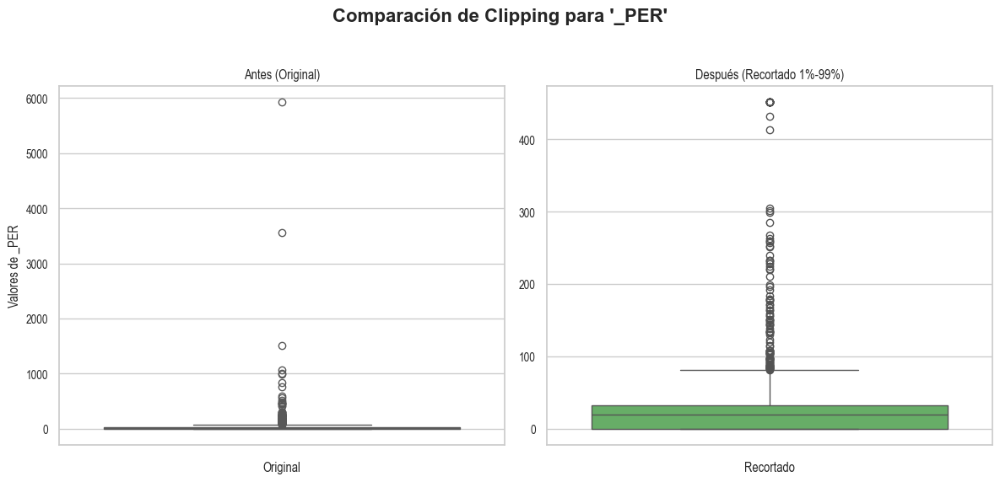

In [17]:
print("\n--- Paso 3: Tratando Outliers Extremos (Clipping 1% - 99%) ---")
# "Recortamos" los valores extremos para reducir el ruido

# Hacemos una copia temporal para los gráficos (opcional, pero más seguro)
X_clipped = X.copy()

for col in NUMERIC_FEATURES:
    q_01 = X_clipped[col].quantile(0.01)
    q_99 = X_clipped[col].quantile(0.99)
    
    # Contar cuántos valores se recortan
    clipped_count = (X_clipped[col] < q_01).sum() + (X_clipped[col] > q_99).sum()
    
    if clipped_count > 0:
        print(f"  -> Recortando {clipped_count} outliers en '{col}'. Generando gráfico...")
        
        # --- Creación del Gráfico "Antes y Después" ---
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
        fig.suptitle(f"Comparación de Clipping para '{col}'", fontsize=16, weight='bold')

        # Boxplot ANTES
        sns.boxplot(y=X[col], ax=ax1, color="#D9534F") # Rojo
        ax1.set_title(f"Antes (Original)")
        ax1.set_ylabel(f"Valores de {col}")
        ax1.set_xlabel("Original")

        # Aplicar el clipping SÓLO a la copia para el gráfico
        X_col_clipped_data = X_clipped[col].clip(q_01, q_99)

        # Boxplot DESPUÉS
        sns.boxplot(y=X_col_clipped_data, ax=ax2, color="#5CB85C") # Verde
        ax2.set_title(f"Después (Recortado 1%-99%)")
        ax2.set_ylabel("") # Ocultar etiqueta Y duplicada
        ax2.set_xlabel("Recortado")
        
        # Guardar el gráfico
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        # plt.savefig(os.path.join(output_dir_boxplots, f"clip_{col}.png"))
        # plt.close(fig) 
        
        # --- Fin del Gráfico ---

        # Aplicar el cambio permanentemente al DataFrame principal 'X'
        X[col] = X_col_clipped_data

    else:
        print(f"  -> No se encontraron outliers extremos en '{col}'. No se recorta.")


In [18]:
print("\n--- Paso 4: Eliminando Multicolinealidad (VIF Iterativo) ---")
# Usamos el Factor de Inflación de Varianza (VIF).
# Un VIF > 10 indica un problema serio de multicolinealidad.

# VIF solo funciona con datos numéricos, así que creamos un df temporal
# También deben estar escalados para un cálculo estable de VIF
X_numeric_scaled = StandardScaler().fit_transform(X[NUMERIC_FEATURES])
X_numeric_scaled_df = pd.DataFrame(X_numeric_scaled, 
                                   columns=NUMERIC_FEATURES, 
                                   index=X.index)

# VIF Iterativo:
# 1. Calcular VIF para todas
# 2. Encontrar la feature con el VIF más alto
# 3. Si es > 10, eliminarla
# 4. Repetir hasta que todas las features tengan VIF <= 10

vif_threshold = 10.0
features_to_keep = NUMERIC_FEATURES.copy()
dropped_vif_cols = []

while True:
    if len(features_to_keep) <= 1:
        break # No podemos calcular VIF con 1 o 0 features

    # Crear el DataFrame solo con las features que quedan
    df_vif_temp = X_numeric_scaled_df[features_to_keep]

    # Calcular VIF
    vif_data = pd.DataFrame()
    vif_data["feature"] = df_vif_temp.columns
    vif_data["VIF"] = [variance_inflation_factor(df_vif_temp.values, i) 
                       for i in range(df_vif_temp.shape[1])]
    
    # Encontrar VIF máximo
    max_vif = vif_data["VIF"].max()
    max_vif_feature = vif_data.loc[vif_data["VIF"].idxmax(), "feature"]
    
    if max_vif > vif_threshold:
        print(f"  -> VIF Alto detectado: '{max_vif_feature}' (VIF = {max_vif:.2f}). Eliminando.")
        # Eliminar la feature de nuestra lista
        features_to_keep.remove(max_vif_feature)
        dropped_vif_cols.append(max_vif_feature)
    else:
        # ¡Éxito! Todas las VIF están por debajo del umbral
        print(f"VIF estable. VIF máximo: {max_vif_feature} ({max_vif:.2f})")
        break

print(f"Columnas eliminadas por VIF alto: {dropped_vif_cols}")

# Actualizamos la lista final de features numéricas
NUMERIC_FEATURES = features_to_keep
# Actualizamos el DataFrame X
X = X[NUMERIC_FEATURES + CATEGORICAL_FEATURES]



--- Paso 4: Eliminando Multicolinealidad (VIF Iterativo) ---
  -> VIF Alto detectado: 'totalDebt' (VIF = 187.28). Eliminando.
  -> VIF Alto detectado: 'marketCap' (VIF = 114.45). Eliminando.
  -> VIF Alto detectado: 'enterpriseValue' (VIF = 63.73). Eliminando.
  -> VIF Alto detectado: 'averageVolume' (VIF = 61.69). Eliminando.
  -> VIF Alto detectado: 'currentPrice' (VIF = 47.80). Eliminando.
  -> VIF Alto detectado: 'sharesOutstanding' (VIF = 36.64). Eliminando.
  -> VIF Alto detectado: 'ebitda' (VIF = 35.58). Eliminando.
  -> VIF Alto detectado: 'totalRevenue' (VIF = 33.72). Eliminando.
  -> VIF Alto detectado: 'floatShares' (VIF = 16.76). Eliminando.
  -> VIF Alto detectado: 'netIncomeToCommon' (VIF = 11.33). Eliminando.
VIF estable. VIF máximo: grossProfits (8.82)
Columnas eliminadas por VIF alto: ['totalDebt', 'marketCap', 'enterpriseValue', 'averageVolume', 'currentPrice', 'sharesOutstanding', 'ebitda', 'totalRevenue', 'floatShares', 'netIncomeToCommon']


In [19]:
print("\n--- Paso 5: Creando el Preprocesador Final ---")
# Ahora que nuestras listas de features están limpias y curadas,
# creamos el 'ColumnTransformer' final.

# Transformador numérico (solo escalar, ya hemos limpiado)
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

# Transformador categórico
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
])

# Combinador final
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, NUMERIC_FEATURES),
        ('cat', categorical_transformer, CATEGORICAL_FEATURES)
    ],
    remainder='passthrough'
)


--- Paso 5: Creando el Preprocesador Final ---


In [20]:
print("\n--- Paso 6: Generando DataFrame Procesado Final ---")

# Aplicamos el preprocesador
X_processed = preprocessor.fit_transform(X)

# Recuperar los nombres de las columnas (¡muy importante!)
cat_feature_names = preprocessor.named_transformers_['cat']['onehot'].get_feature_names_out(CATEGORICAL_FEATURES)
final_feature_names = NUMERIC_FEATURES + list(cat_feature_names)

# Crear el DataFrame final
X_processed_df = pd.DataFrame(
    X_processed, 
    columns=final_feature_names,
    index=X.index
)

print("\n--- PRE-PROCESAMIENTO AVANZADO COMPLETADO ---")
print(f"Forma del DataFrame procesado final (X_processed_df): {X_processed_df.shape}")
print("DataFrame 'y' (target) también está listo.")
print("\n--- Head del DataFrame Procesado (X_processed_df) ---")
print(X_processed_df.head())



--- Paso 6: Generando DataFrame Procesado Final ---

--- PRE-PROCESAMIENTO AVANZADO COMPLETADO ---
Forma del DataFrame procesado final (X_processed_df): (1498, 102)
DataFrame 'y' (target) también está listo.

--- Head del DataFrame Procesado (X_processed_df) ---
   numberOfAnalystOpinions  allTimeHigh  allTimeLow   beta  priceToBook  enterpriseToRevenue  profitMargins  grossMargins  ebitdaMargins  operatingMargins  returnOnAssets  returnOnEquity  revenuePerShare  grossProfits  trailingEps  totalCash  totalCashPerShare  quickRatio  currentRatio  bookValue  operatingCashflow  freeCashflow  trailingAnnualDividendYield  payoutRatio  sharesShort  sharesPercentSharesOut  shortRatio  shortPercentOfFloat  heldPercentInsiders  heldPercentInstitutions  fullTimeEmployees  _debtToEquity   _PER  sector_Basic Materials  sector_Communication Services  sector_Consumer Cyclical  sector_Consumer Defensive  sector_Energy  sector_Financial Services  sector_Healthcare  sector_Industrials  sector_Real Esta

#### PASO 5. GUARDO EL NUEVO DATASET PROCESADO

In [21]:
X_processed_df.index = y.index
final_df = pd.concat([y, X_processed_df], axis=1)

# final_df.to_csv('../processed_main_financial_metrics.csv', index=False)